Ce notebook contient la partie 1 sur la classification binaire non supervisée. La méthode utilisée ici est de créer un auto encodeur et d'ensuite faire du clustering, de la classification non supervisée.

In [1]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

In [2]:
DRIVE_PATH = '/home/procope/ProjetHDDL/'
TEST_LIST_DIR = os.path.join(DRIVE_PATH, 'annotations')
IMAGE_DIR = os.path.join(DRIVE_PATH, 'images')
ANNOTATION_FILE = os.path.join(TEST_LIST_DIR, 'list.txt')
TEST_LIST_FILE = os.path.join(TEST_LIST_DIR, 'test.txt')

In [3]:
print(TEST_LIST_FILE)

/home/procope/ProjetHDDL/annotations/test.txt


In [4]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image

class OxfordDataset(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.classes = []
        # La liste des tuples (chemin_image_complet, label_index_numerique)
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        """
        Analyse le fichier d'annotation au format Oxford-IIIT Pet (Image CLASS-ID SPECIES BREED ID).
        Utilise le CLASS-ID comme étiquette de classification.
        """
        data_list = []
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()
                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" 
                    class_id_str = '_'.join(parts[0].split('_')[:-1])
                    if class_id_str not in label_to_index:
                        label_to_index[class_id_str] = index_counter
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]
                    full_image_path = os.path.join(self.image_dir, image_filename)
                    if not os.path.exists(full_image_path):
                        
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []

        return data_list

    def __len__(self):
        """ Retourne le nombre total d'échantillons. """
        return len(self.data)

    def __getitem__(self, idx):
        """ Récupère un échantillon à l'index donné: (image, label_index). """
        img_path, label_index = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label_index, dtype=torch.long)

In [5]:
from glob import glob
print(f"Recherche des fichiers dans : {IMAGE_DIR}\n")
image_files = []
image_files.extend(glob(os.path.join(IMAGE_DIR, '**', '*.jpg'), recursive=True))
image_files.extend(glob(os.path.join(IMAGE_DIR, '**', '*.png'), recursive=True))
total_files = len(image_files)
print(f"Nombre total de fichiers image trouvés: **{total_files}**\n")

Recherche des fichiers dans : /home/procope/ProjetHDDL/images

Nombre total de fichiers image trouvés: **7390**



In [6]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),        # Redimensionne initialement l'image
    transforms.RandomCrop(224),           # Rogne aléatoirement à 224x224 (Augmentation)
    transforms.RandomHorizontalFlip(),    # Retourne l'image horizontalement au hasard (Augmentation)
    transforms.ToTensor(),                # Convertit l'image PIL en tenseur PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # Normalisation standard ImageNet
                         std=[0.229, 0.224, 0.225])
])

In [7]:
import os
import torch
from torch.utils.data import Subset, random_split, DataLoader

# --- 0. Définition des chemins (à adapter si nécessaire) ---
# NOTE : J'ai remis le chemin du dossier annotations car c'est là que 'test.txt' se trouve souvent.



def create_data_splits(full_dataset, test_list_path, val_ratio=0.1):
    """
    Sépare le jeu de données en Train/Validation/Test, le Test étant défini
    par un fichier de liste externe au format Oxford-IIIT Pet.
    """

    # 1. Charger les noms des fichiers du jeu de test
    test_filenames = set()
    try:
        with open(test_list_path, 'r') as f:
            for line in f:
                # Ignorer les lignes de commentaires et les lignes vides
                if line.startswith('#') or not line.strip():
                    continue

                parts = line.strip().split()

                if not parts:
                    continue

                # CORRECTION : On prend la première partie (Nom_Image) et on ajoute .jpg
                image_filename_base = parts[0] + ".jpg"

                # Le nom de fichier complet à comparer doit inclure l'extension (ex: Abyssinian_201.jpg)
                test_filenames.add(image_filename_base)

    except FileNotFoundError:
        print(f"ERREUR: Fichier de liste de test non trouvé à {test_list_path}. Retourne des Subsets vides.")
        return None, None, None

    # 2. Identifier les indices (indices) pour le Test vs. Train/Val
    test_indices = []
    train_val_indices = []

    # Rappel : full_dataset.data contient (chemin_complet, label_index)
    for i, (full_path, _) in enumerate(full_dataset.data):
        # On extrait le nom de fichier complet (ex: Abyssinian_201.jpg)
        filename = os.path.basename(full_path)


        if filename in test_filenames:
            test_indices.append(i)
        else:
            train_val_indices.append(i)

    print(f"Indices identifiés : Train/Val = {len(train_val_indices)} | Test = {len(test_indices)}")

    if not train_val_indices or not test_indices:
         print("Attention : un ou plusieurs ensembles sont vides. Vérifiez le fichier de test.")

    # 3. Créer le jeu de Test (à partir des indices)
    test_subset = Subset(full_dataset, test_indices)

    # 4. Diviser l'ensemble (Train + Val)
    train_val_size = len(train_val_indices)
    val_size = int(val_ratio * train_val_size)
    train_size = train_val_size - val_size

    train_val_subset = Subset(full_dataset, train_val_indices)

    # Note : Le train_val_subset hérite des transformations du full_dataset,
    #        qui doivent être les train_transforms à ce stade.
    train_subset, val_subset = random_split(
        train_val_subset,
        [train_size, val_size],
        generator=torch.Generator().manual_seed(42)
    )

    return train_subset, val_subset, test_subset

In [8]:

from torchvision import transforms

# --- Définition des Transformations ---
# (Reprise des transformations pour l'exhaustivité)

# Transformations pour l'entraînement (avec augmentation)
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])

# Transformations pour la validation et le test (sans augmentation)
eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


# --- 1. Instanciation du Dataset Complet (avec TRAIN_TRANSFORMS) ---

# Le Dataset complet est initialisé avec les TRAIN_TRANSFORMS pour que le split Train/Val en bénéficie.
full_dataset = OxfordDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=train_transforms # <-- Utilisation de train_transforms ici
)

# --- 2. Application de la Division Personnalisée ---
train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)

# --- 3. Ajustement des Transformations pour Val et Test ---

# Le Subset obtenu après random_split ou Subset() utilise la transformation du dataset parent.
# Nous devons créer de nouvelles instances pour la validation et le test
# en utilisant les eval_transforms, car ils ne doivent pas utiliser l'augmentation.

# Créez une version du Dataset complet avec les transformations d'évaluation
full_dataset_eval = OxfordDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms # <-- Utilisation de eval_transforms ici
)

# Recréez les Subsets de validation et de test avec les indices d'origine
# mais à partir du full_dataset_eval.
if val_subset_train_tf and test_subset_train_tf:

    # On récupère les indices des subsets précédemment créés
    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_eval, val_indices)
    test_subset = Subset(full_dataset_eval, test_indices)
else:
    # Gérer le cas d'erreur si la fonction a échoué
    val_subset, test_subset = None, None

# --- 4. Instancier les DataLoaders ---
batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    # Train DataLoader (avec TRAIN_TRANSFORMS + mélange)
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, pin_memory=True)

    # Validation DataLoader (avec EVAL_TRANSFORMS + pas de mélange)
    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, pin_memory=True)

    # Test DataLoader (avec EVAL_TRANSFORMS + pas de mélange)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669
Dataset initialisé. Nombre total d'échantillons: 7349

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


# PARTIE 1 : Prétraitement

# Prétraitement par race d'animal

Counter({1: 200, 2: 200, 3: 200, 4: 200, 5: 200, 6: 200, 9: 200, 10: 200, 13: 200, 14: 200, 15: 200, 16: 200, 17: 200, 19: 200, 20: 200, 21: 200, 23: 200, 24: 200, 25: 200, 26: 200, 27: 200, 28: 200, 29: 200, 31: 200, 33: 200, 35: 200, 36: 200, 8: 199, 18: 199, 30: 199, 32: 199, 0: 198, 12: 196, 22: 196, 11: 190, 34: 189, 7: 184})

Répartition des échantillons par classe (CLASS-ID)
Classe Abyssinian                 : 198 échantillons
Classe american_bulldog           : 200 échantillons
Classe american_pit_bull_terrier  : 200 échantillons
Classe basset_hound               : 200 échantillons
Classe beagle                     : 200 échantillons
Classe Bengal                     : 200 échantillons
Classe Birman                     : 200 échantillons
Classe Bombay                     : 184 échantillons
Classe boxer                      : 199 échantillons
Classe British_Shorthair          : 200 échantillons
Classe chihuahua                  : 200 échantillons
Classe Egyptian_Mau             

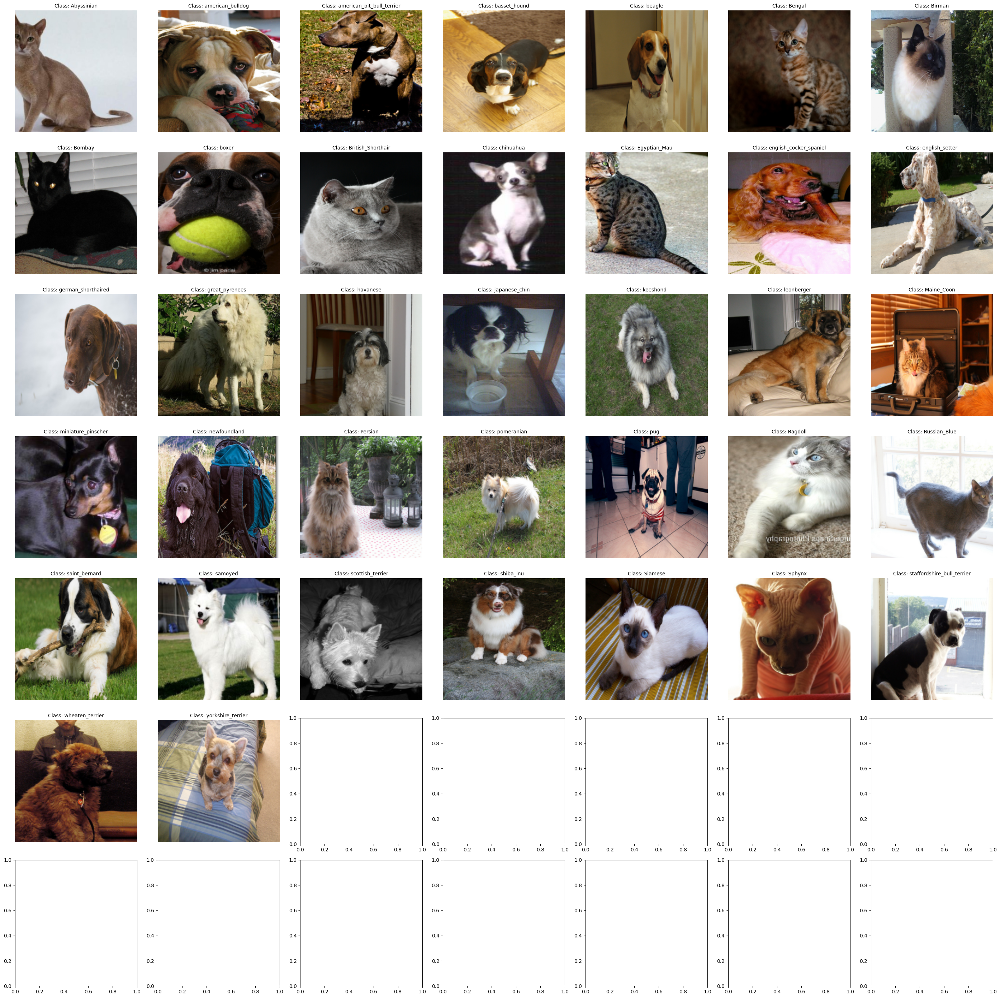

In [9]:
from collections import Counter
import random
label_indices = [item[1] for item in full_dataset.data]

# Compter les occurrences de chaque index
count_per_index = Counter(label_indices)
print(count_per_index)
# Mapper les index aux noms de classe (CLASS-ID) pour l'affichage
class_distribution = {
    full_dataset.classes[index]: count
    for index, count in sorted(count_per_index.items())
}

print("\n" + "="*50)
print("Répartition des échantillons par classe (CLASS-ID)")
print("="*50)

# Afficher le tableau de distribution
max_class_len = max(len(c) for c in class_distribution.keys())
for class_id, count in class_distribution.items():
    print(f"Classe {class_id.ljust(max_class_len)} : {count} échantillons")

print("="*50)

# =========================================================================
# 2. Plotter une image par classe
# =========================================================================

num_classes = len(full_dataset.classes)

# Trouver un index aléatoire par classe
# Groupement des index du dataset par index de classe
class_to_indices = {}
for idx, (_, label_index) in enumerate(full_dataset.data):
    if label_index not in class_to_indices:
        class_to_indices[label_index] = []
    class_to_indices[label_index].append(idx)

# Sélectionner un index aléatoire pour chaque classe
selected_indices = {
    label_index: random.choice(indices)
    for label_index, indices in class_to_indices.items()
}

# Déterminer la disposition de la grille pour l'affichage
# On utilise sqrt(N) x sqrt(N)
grid_size = int(torch.ceil(torch.sqrt(torch.tensor(num_classes))).item())

fig, axes = plt.subplots(grid_size, grid_size, figsize=(4 * grid_size, 4 * grid_size))

# Assurer que axes est toujours un tableau 2D pour une itération facile
if grid_size == 1:
    axes = [[axes]]
elif grid_size * grid_size > num_classes:
    axes = axes.flatten()

print(f"\nGénération d'un diagramme de {num_classes} images ({grid_size}x{grid_size} grille)...")

for i in range(num_classes):
    row = i // grid_size
    col = i % grid_size

    # Pour gérer le cas où il y a moins d'images que de slots dans la grille
    if i >= len(selected_indices):
        # Masquer les axes inutilisés
        if grid_size == 1:
            ax = axes[0][0]
        elif grid_size * grid_size > num_classes:
            ax = axes[i]
        else:
            ax = axes[row, col]
        ax.axis('off')
        continue

    # Récupérer l'index d'échantillon pour cette classe
    sample_idx = selected_indices[i]

    # Récupérer l'échantillon (Tensor PyTorch)
    image_tensor, label_index = full_dataset[sample_idx]
    class_id = full_dataset.classes[label_index.item()]

    # Convertir le Tensor PyTorch en image pour Matplotlib (C, H, W) -> (H, W, C)
    image_np = image_tensor.permute(1, 2, 0).numpy()

    # Afficher l'image
    if grid_size == 1:
        ax = axes[0][0]
    elif grid_size * grid_size > num_classes:
        ax = axes[i]
    else:
        ax = axes[row, col]

    ax.imshow(image_np)
    ax.set_title(f"Class: {class_id}", fontsize=10)
    ax.axis('off') # Masquer les axes pour un meilleur affichage

# Ajuster la mise en page pour éviter le chevauchement
plt.tight_layout()

# Sauvegarder la figure
plot_filename = 'images_par_classe.png'
plt.savefig(plot_filename)
print(f"\nImage enregistrée sous : {plot_filename}")
plt.show()

## Répartition par type


In [10]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image

# MODIFIEZ ces chemins pour qu'ils correspondent à l'emplacement de vos données
DRIVE_PATH = '/home/procope/ProjetHDDL/'
IMAGE_DIR = os.path.join(DRIVE_PATH, 'images') # Corrected path
ANNOTATION_FILE = os.path.join(DRIVE_PATH, 'annotations', 'list.txt')
# Le fichier d'annotation doit lister 'nom_fichier_image ID_numerique'

class OxfordDatasetType(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Le dictionnaire {label_index: label_string}
        self.classes = []
        # La liste des tuples (chemin_image_complet, label_index_numerique)
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        """
        Analyse le fichier d'annotation au format Oxford-IIIT Pet (Image CLASS-ID SPECIES BREED ID).
        Utilise le CLASS-ID comme étiquette de classification.
        """
        data_list = []
        # On utilise CLASS-ID (la 2e colonne) comme nom de classe pour le mapping
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    # Ignorer les lignes de commentaires et les lignes vides
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()

                    # Nous attendons au moins Image, CLASS-ID, SPECIES, BREED ID (4 parties)
                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" # Le nom du fichier image (ex: Abyssinian_100.jpg)
                    class_id_str = parts[2]             # La CLASS-ID (ex: '1')

                    # --- Logique de mapping CLASS-ID vers Index numérique ---

                    # Le CLASS-ID (string) est l'identifiant réel de la classe (ex: '1' à '37')
                    # Nous mappons cet identifiant à un index numérique séquentiel (0, 1, 2, ...)
                    if class_id_str not in label_to_index:
                        # Assigner l'index séquentiel (0, 1, 2...) au CLASS-ID
                        label_to_index[class_id_str] = index_counter
                        # Stocker le CLASS-ID réel (ex: '1') comme le nom de la classe
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]

                    # Le dataset Oxford-IIIT Pet utilise généralement des fichiers .jpg
                    full_image_path = os.path.join(self.image_dir, image_filename)

                    # Vérification optionnelle: si l'image n'a pas le .jpg, essayons sans
                    if not os.path.exists(full_image_path):
                         # Tente le nom de fichier directement (au cas où il y aurait une extension différente ou aucune extension)
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            # Si le fichier n'est pas trouvé (ce qui est courant dans les datasets volumineux)
                            # Nous ajoutons quand même l'entrée mais notons que le fichier est manquant
                            # Pour éviter de futurs FileNotFoundError, on pourrait ignorer cette entrée,
                            # mais nous allons l'inclure pour le comptage total:
                            # print(f"ATTENTION: Fichier image non trouvé pour {image_filename}")
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []
        print("INDEX COUNTER")
        print(index_counter)
        return data_list

    def __len__(self):
        """ Retourne le nombre total d'échantillons. """
        return len(self.data)

    def __getitem__(self, idx):
        """ Récupère un échantillon à l'index donné: (image, label_index). """

        # Récupérer le chemin de l'image et l'index de la classe
        img_path, label_index = self.data[idx]

        # 1. Charger l'image
        image = Image.open(img_path).convert('RGB')

        # 2. Appliquer les transformations
        if self.transform:
            image = self.transform(image)

        # 3. Retourner l'image et l'index de la classe
        return image, torch.tensor(label_index, dtype=torch.long)

In [11]:
from torchvision import transforms

# --- Définition des Transformations ---
# (Reprise des transformations pour l'exhaustivité)

# Transformations pour l'entraînement (avec augmentation)
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                    std=[0.229, 0.224, 0.225])
])

# Transformations pour la validation et le test (sans augmentation)
eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


# --- 1. Instanciation du Dataset Complet (avec TRAIN_TRANSFORMS) ---

# Le Dataset complet est initialisé avec les TRAIN_TRANSFORMS pour que le split Train/Val en bénéficie.
full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms # <-- Utilisation de eval_transforms ici
)

# --- 2. Application de la Division Personnalisée ---
train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)

# --- 3. Ajustement des Transformations pour Val et Test ---

# Le Subset obtenu après random_split ou Subset() utilise la transformation du dataset parent.
# Nous devons créer de nouvelles instances pour la validation et le test
# en utilisant les eval_transforms, car ils ne doivent pas utiliser l'augmentation.

# Créez une version du Dataset complet avec les transformations d'évaluation
full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms # <-- Utilisation de eval_transforms ici
)

# Recréez les Subsets de validation et de test avec les indices d'origine
# mais à partir du full_dataset_eval.
if val_subset_train_tf and test_subset_train_tf:

    # On récupère les indices des subsets précédemment créés
    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:
    # Gérer le cas d'erreur si la fonction a échoué
    val_subset, test_subset = None, None

# --- 4. Instancier les DataLoaders ---
batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    # Train DataLoader (avec TRAIN_TRANSFORMS + mélange)
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    # Validation DataLoader (avec EVAL_TRANSFORMS + pas de mélange)
    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)

    # Test DataLoader (avec EVAL_TRANSFORMS + pas de mélange)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669
INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


Counter({1: 4978, 0: 2371})

Répartition des échantillons par classe (CLASS-ID)
Classe 1 : 2371 échantillons
Classe 2 : 4978 échantillons

Génération d'un diagramme de 2 images (2x2 grille)...

Image enregistrée sous : images_par_classe.png


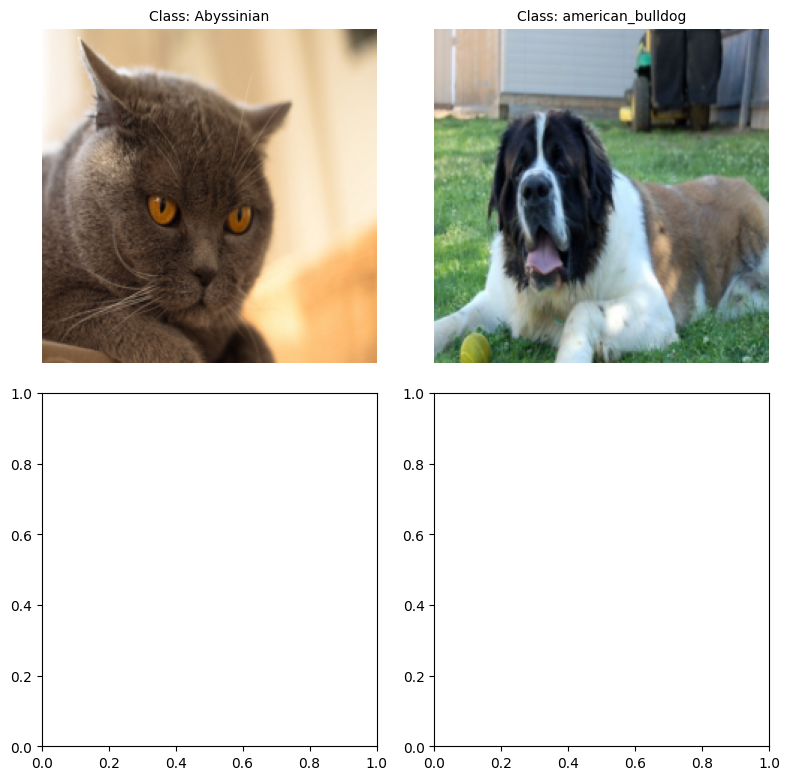

In [12]:
from collections import Counter
import random
label_indices = [item[1] for item in full_dataset_type.data]

# Compter les occurrences de chaque index
count_per_index = Counter(label_indices)
print(count_per_index)
# Mapper les index aux noms de classe (CLASS-ID) pour l'affichage
class_distribution = {
    full_dataset_type.classes[index]: count
    for index, count in sorted(count_per_index.items())
}

print("\n" + "="*50)
print("Répartition des échantillons par classe (CLASS-ID)")
print("="*50)

# Afficher le tableau de distribution
max_class_len = max(len(c) for c in class_distribution.keys())
for class_id, count in class_distribution.items():
    print(f"Classe {class_id.ljust(max_class_len)} : {count} échantillons")

print("="*50)

# =========================================================================
# 2. Plotter une image par classe
# =========================================================================

num_classes = len(full_dataset_type.classes)

# Trouver un index aléatoire par classe
# Groupement des index du dataset par index de classe
class_to_indices = {}
for idx, (_, label_index) in enumerate(full_dataset_type.data):
    if label_index not in class_to_indices:
        class_to_indices[label_index] = []
    class_to_indices[label_index].append(idx)

# Sélectionner un index aléatoire pour chaque classe
selected_indices = {
    label_index: random.choice(indices)
    for label_index, indices in class_to_indices.items()
}

# Déterminer la disposition de la grille pour l'affichage
# On utilise sqrt(N) x sqrt(N)
grid_size = int(torch.ceil(torch.sqrt(torch.tensor(num_classes))).item())

fig, axes = plt.subplots(grid_size, grid_size, figsize=(4 * grid_size, 4 * grid_size))

# Assurer que axes est toujours un tableau 2D pour une itération facile
if grid_size == 1:
    axes = [[axes]]
elif grid_size * grid_size > num_classes:
    axes = axes.flatten()

print(f"\nGénération d'un diagramme de {num_classes} images ({grid_size}x{grid_size} grille)...")

for i in range(num_classes):
    row = i // grid_size
    col = i % grid_size

    # Pour gérer le cas où il y a moins d'images que de slots dans la grille
    if i >= len(selected_indices):
        # Masquer les axes inutilisés
        if grid_size == 1:
            ax = axes[0][0]
        elif grid_size * grid_size > num_classes:
            ax = axes[i]
        else:
            ax = axes[row, col]
        ax.axis('off')
        continue

    # Récupérer l'index d'échantillon pour cette classe
    sample_idx = selected_indices[i]

    # Récupérer l'échantillon (Tensor PyTorch)
    image_tensor, label_index = full_dataset_type[sample_idx]
    class_id = full_dataset.classes[label_index.item()]

    # Convertir le Tensor PyTorch en image pour Matplotlib (C, H, W) -> (H, W, C)
    image_np = image_tensor.permute(1, 2, 0).numpy()

    # Afficher l'image
    if grid_size == 1:
        ax = axes[0][0]
    elif grid_size * grid_size > num_classes:
        ax = axes[i]
    else:
        ax = axes[row, col]

    ax.imshow(image_np)
    ax.set_title(f"Class: {class_id}", fontsize=10)
    ax.axis('off') # Masquer les axes pour un meilleur affichage

# Ajuster la mise en page pour éviter le chevauchement
plt.tight_layout()

# Sauvegarder la figure
plot_filename = 'images_par_classe.png'
plt.savefig(plot_filename)
print(f"\nImage enregistrée sous : {plot_filename}")
plt.show()


Répartition des échantillons par espèce (Cat/Dog)
Espèce Cat : 2371 échantillons
Espèce Dog : 4978 échantillons

Génération d'un diagramme de 5 images par espèce (2x5 grille)...

Image enregistrée sous : images_par_espece.png


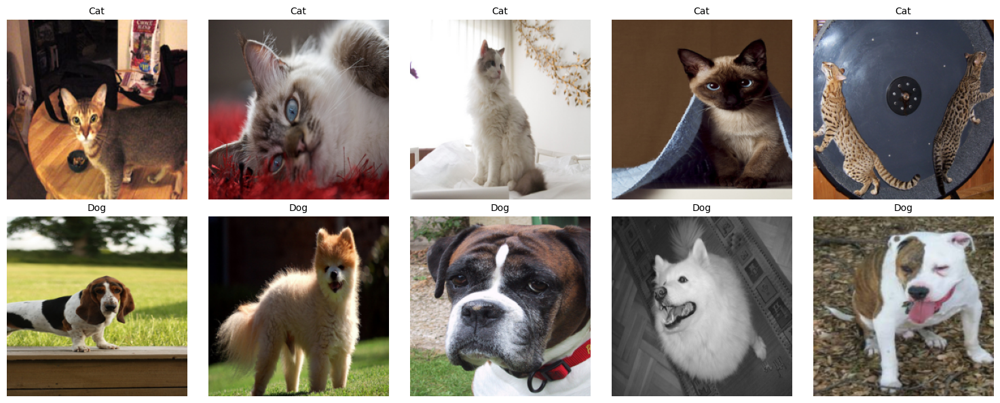

In [13]:

from collections import Counter
import random
import matplotlib.pyplot as plt
import torch
import numpy as np # Ensure numpy is imported for .numpy() calls

label_indices = [item[1] for item in full_dataset_type.data]

# Assuming full_dataset_type.classes[0] is species '1' (Cat) and full_dataset_type.classes[1] is species '2' (Dog)
# This mapping connects the numerical label_index (0 or 1) to the desired display name ('Cat' or 'Dog').
species_names_map = {0: 'Cat', 1: 'Dog'}

# Compter les occurrences de chaque index (0 ou 1)
count_per_index = Counter(label_indices)

# Préparer la distribution pour l'affichage avec les noms d'espèces
class_distribution_for_print = {
    species_names_map[index]: count
    for index, count in sorted(count_per_index.items())
}

print("\n" + "="*50)
print("Répartition des échantillons par espèce (Cat/Dog)")
print("="*50)

# Afficher le tableau de distribution
# Utiliser les valeurs de species_names_map pour déterminer la longueur maximale du nom
max_class_len = max(len(name) for name in species_names_map.values())
for class_name, count in class_distribution_for_print.items():
    print(f"Espèce {class_name.ljust(max_class_len)} : {count} échantillons")

print("="*50)

# =========================================================================
# 2. Plotter 5 images par espèce
# =========================================================================

num_classes = len(full_dataset_type.classes) # Should be 2 (Cat, Dog)
num_images_to_plot_per_species = 5

# Groupement des index du dataset par index de classe (0 ou 1)
class_to_indices = {}
for idx, (_, label_index) in enumerate(full_dataset_type.data):
    if label_index not in class_to_indices:
        class_to_indices[label_index] = []
    class_to_indices[label_index].append(idx)

# Sélectionner un nombre fixe d'échantillons aléatoires pour chaque espèce
selected_samples_per_species = {}
for label_index, indices in class_to_indices.items():
    # S'assurer de ne pas échantillonner plus d'images qu'il n'y en a de disponibles
    num_to_sample = min(len(indices), num_images_to_plot_per_species)
    selected_samples_per_species[label_index] = random.sample(indices, num_to_sample)

# Déterminer la disposition de la grille pour l'affichage
nrows = num_classes
ncols = num_images_to_plot_per_species
fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
axes = axes.flatten() # Aplatir le tableau 2D d'axes pour une itération facile

print(f"\nGénération d'un diagramme de {num_images_to_plot_per_species} images par espèce ({nrows}x{ncols} grille)...")

plot_idx = 0
# Itérer sur les indices de label (0, 1) pour assurer un ordre cohérent
for label_index in sorted(selected_samples_per_species.keys()):
    species_display_name = species_names_map[label_index] # Obtenir 'Cat' ou 'Dog'

    for sample_dataset_idx in selected_samples_per_species[label_index]:
        # Récupérer l'échantillon (Tensor PyTorch)
        # full_dataset_type est initialisé avec eval_transforms qui incluent ToTensor()
        image_tensor, _ = full_dataset_type[sample_dataset_idx]

        # Convertir le Tensor PyTorch en image pour Matplotlib (C, H, W) -> (H, W, C)
        # ToTensor() met les valeurs entre 0 et 1, donc pas besoin de dé-normaliser ici
        image_np = image_tensor.permute(1, 2, 0).numpy()

        ax = axes[plot_idx]
        ax.imshow(image_np)
        ax.set_title(species_display_name, fontsize=10)
        ax.axis('off') # Masquer les axes pour un meilleur affichage
        plot_idx += 1

# Masquer les axes inutilisés si le nombre total d'images affichées est inférieur au nombre total de sous-plots
while plot_idx < nrows * ncols:
    axes[plot_idx].axis('off')
    plot_idx += 1

# Ajuster la mise en page pour éviter le chevauchement
plt.tight_layout()

# Sauvegarder la figure
plot_filename = 'images_par_espece.png' # Nom de fichier mis à jour
plt.savefig(plot_filename)
print(f"\nImage enregistrée sous : {plot_filename}")
plt.show()


# 
PARTIE 2 : Classification binaire

In [ ]:
from torchvision import transforms

# --- Définition des Transformations ---
# (Reprise des transformations pour l'exhaustivité)

# Transformations pour l'entraînement (avec augmentation)
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)


if val_subset_train_tf and test_subset_train_tf:

    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:
    val_subset, test_subset = None, None

batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669
INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNChatChien(nn.Module):
    def __init__(self):
        super().__init__()

        # Feature extractor
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)

        # Classifier
        self.fc1 = nn.Linear(128 * 28 * 28, 256)  
        self.fc2 = nn.Linear(256, 1)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)      # PAS de sigmoid ici

        return x


In [21]:
labels_all = []
for _, labels in train_dataloader:
    labels_all.append(labels)

labels_all = torch.cat(labels_all)
print(labels_all.min(), labels_all.max())
print(labels_all.unique())


tensor(0) tensor(1)
tensor([0, 1])


In [22]:
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChien().to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


In [14]:
import copy
import torch

def train_model(model, train_loader, val_loader, criterion, optimizer, 
                num_epochs=10):

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": []
    }

    best_val_loss = float("inf")
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):

        # ======================
        # TRAIN
        # ======================
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.float().to(device)

            optimizer.zero_grad()
            outputs = model(images).squeeze(1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            preds = (torch.sigmoid(outputs) > 0.5).float()
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        train_loss /= len(train_loader)
        train_acc = train_correct / train_total

        # ======================
        # VALIDATION
        # ======================
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.float().to(device)

                outputs = model(images).squeeze(1)
                loss = criterion(outputs, labels)

                val_loss += loss.item()

                preds = (torch.sigmoid(outputs) > 0.5).float()
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= len(val_loader)
        val_acc = val_correct / val_total

        # ======================
        # SAVE HISTORY
        # ======================
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        # ======================
        # SAVE BEST MODEL
        # ======================
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            torch.save(best_model_wts, "/home/procope/ProjetHDDL/best_model.pth")

        # ======================
        # LOG
        # ======================
        print(
            f"Epoch [{epoch+1}/{num_epochs}] | "
            f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
            f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}"
        )

    # Charger le meilleur modèle avant de retourner
    model.load_state_dict(best_model_wts)

    return model, history


In [24]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 0.6472 | Train Acc: 0.6685 | Val Loss: 0.6158 | Val Acc: 0.6902
Epoch [2/20] | Train Loss: 0.6077 | Train Acc: 0.6763 | Val Loss: 0.5937 | Val Acc: 0.7011
Epoch [3/20] | Train Loss: 0.5877 | Train Acc: 0.6935 | Val Loss: 0.5800 | Val Acc: 0.7065
Epoch [4/20] | Train Loss: 0.5601 | Train Acc: 0.7165 | Val Loss: 0.5570 | Val Acc: 0.7147
Epoch [5/20] | Train Loss: 0.5127 | Train Acc: 0.7421 | Val Loss: 0.5599 | Val Acc: 0.7364
Epoch [6/20] | Train Loss: 0.4776 | Train Acc: 0.7766 | Val Loss: 0.5614 | Val Acc: 0.7174
Epoch [7/20] | Train Loss: 0.4317 | Train Acc: 0.7977 | Val Loss: 0.6005 | Val Acc: 0.7310
Epoch [8/20] | Train Loss: 0.3750 | Train Acc: 0.8333 | Val Loss: 0.5931 | Val Acc: 0.7473
Epoch [9/20] | Train Loss: 0.3095 | Train Acc: 0.8696 | Val Loss: 0.7599 | Val Acc: 0.7337
Epoch [10/20] | Train Loss: 0.2351 | Train Acc: 0.9058 | Val Loss: 0.7574 | Val Acc: 0.7283
Epoch [11/20] | Train Loss: 0.1817 | Train Acc: 0.9236 | Val Loss: 0.9459 | Val Acc: 0.74

In [15]:
def plot_history(history):
    import matplotlib.pyplot as plt

    plt.figure()
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs Epochs")
    plt.legend()
    plt.grid(True)
    plt.show()
    plt.figure()
    plt.plot(history["train_acc"], label="Train Accuracy")
    plt.plot(history["val_acc"], label="Val Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy vs Epochs")
    plt.legend()
    plt.grid(True)
    plt.show()


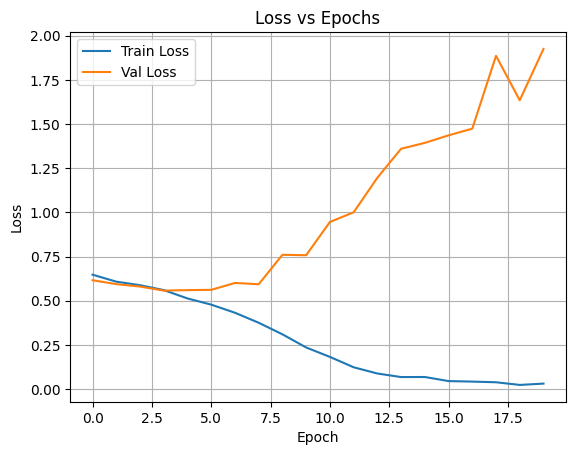

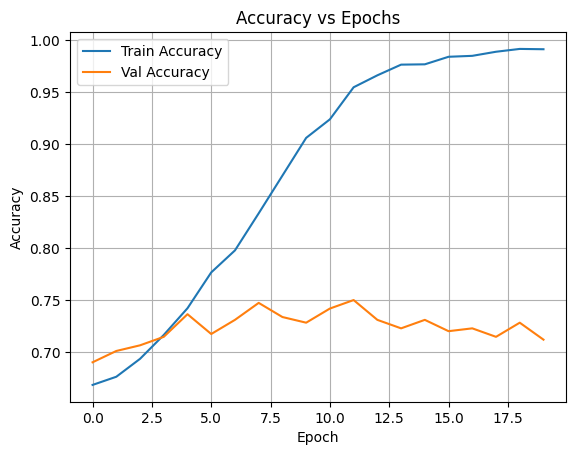

In [27]:
plot_history(history)

In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, dataloader, device, class_names=["Chat", "Chien"]):
    """
    Calcule et affiche la matrice de confusion pour un modèle binaire,
    avec le pourcentage d'accuracy affiché dans le titre.

    Args:
        model : torch.nn.Module
            Modèle entraîné
        dataloader : DataLoader
            Dataloader du dataset de test/validation
        device : torch.device
            CPU ou GPU
        class_names : list
            Liste des noms de classes (ordre : 0 -> chat, 1 -> chien)
    """
    model.eval()

    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images).squeeze(1)
            probs = torch.sigmoid(outputs)
            preds = (probs > 0.5).int()

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:\n", cm)

    # Calcul de l'accuracy
    accuracy = (y_true == y_pred).sum() / len(y_true) * 100
    print(f"Accuracy: {accuracy:.2f}%")

    # Plot
    plt.figure(figsize=(5,5))
    plt.imshow(cm, cmap=plt.cm.Blues)
    plt.colorbar()
    plt.xticks([0, 1], class_names)
    plt.yticks([0, 1], class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="red", fontsize=14)

    plt.title(f"Confusion Matrix - Accuracy: {accuracy:.2f}%")
    plt.show()

    return cm, y_true, y_pred


Confusion Matrix:
 [[ 453  730]
 [ 264 2222]]
Accuracy: 72.91%


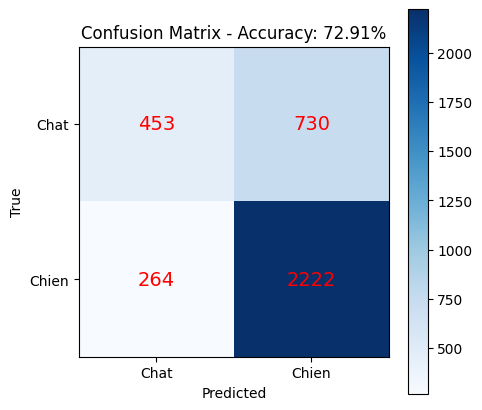

In [29]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chat", "Chien"])


On remarque que notre dataset est pas bien balancé on a 2 fois plus de Chiens que de chats il faut donc ajouter une pondération à la perte car le modèle tend à tout classer en chien pour augmenter l'accuracy.

On doit échanger les labels pour ajouter un poids de pondération sur les chats

In [17]:
class OxfordDatasetType(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Le dictionnaire {label_index: label_string}
        self.classes = []
        # La liste des tuples (chemin_image_complet, label_index_numerique)
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        """
        Analyse le fichier d'annotation au format Oxford-IIIT Pet (Image CLASS-ID SPECIES BREED ID).
        Utilise le CLASS-ID comme étiquette de classification.
        """
        data_list = []
        # On utilise CLASS-ID (la 2e colonne) comme nom de classe pour le mapping
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()

                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" 
                    class_id_str = parts[2]            

                    if class_id_str not in label_to_index:
                        label_to_index[class_id_str] = index_counter
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]
                    full_image_path = os.path.join(self.image_dir, image_filename)

                    if not os.path.exists(full_image_path):
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []
        print("INDEX COUNTER")
        print(index_counter)
        return data_list

    def __len__(self):
        """ Retourne le nombre total d'échantillons. """
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        
        # Inversion des labels : chats=1, chiens=0
        label = 1 - label   # si chats=0, chiens=1 dans les annotations d'origine
        
        return image, label

In [39]:
from torchvision import transforms

# --- Définition des Transformations ---
# (Reprise des transformations pour l'exhaustivité)

# Transformations pour l'entraînement (avec augmentation)
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)


if val_subset_train_tf and test_subset_train_tf:

    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:
    val_subset, test_subset = None, None

batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")


INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


In [18]:
import torch

# Récupérer tous les labels du train_dataset
labels_all = torch.tensor([label for _, label in train_subset])

n_chiens = (labels_all == 0).sum()   # minoritaire
n_chats = (labels_all == 1).sum()  # majoritaire
print(n_chiens)
print(n_chats)
pos_weight = n_chiens / n_chats     # >1 pour classe minoritaire
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))

tensor(1074)
tensor(2238)
pos_weight = 0.479892760515213


NameError: name 'nn' is not defined

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChien().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


In [49]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 0.9502 | Train Acc: 0.4016 | Val Loss: 0.9257 | Val Acc: 0.3098
Epoch [2/20] | Train Loss: 0.9351 | Train Acc: 0.4130 | Val Loss: 0.9237 | Val Acc: 0.3696
Epoch [3/20] | Train Loss: 0.8856 | Train Acc: 0.5915 | Val Loss: 0.8837 | Val Acc: 0.5652
Epoch [4/20] | Train Loss: 0.7996 | Train Acc: 0.6748 | Val Loss: 0.8873 | Val Acc: 0.6522
Epoch [5/20] | Train Loss: 0.7432 | Train Acc: 0.7147 | Val Loss: 0.9364 | Val Acc: 0.5815
Epoch [6/20] | Train Loss: 0.6457 | Train Acc: 0.7585 | Val Loss: 0.9765 | Val Acc: 0.6196
Epoch [7/20] | Train Loss: 0.5203 | Train Acc: 0.8204 | Val Loss: 0.9940 | Val Acc: 0.6603
Epoch [8/20] | Train Loss: 0.3732 | Train Acc: 0.8904 | Val Loss: 1.2995 | Val Acc: 0.6304
Epoch [9/20] | Train Loss: 0.2394 | Train Acc: 0.9269 | Val Loss: 1.8775 | Val Acc: 0.6848
Epoch [10/20] | Train Loss: 0.1559 | Train Acc: 0.9565 | Val Loss: 2.0881 | Val Acc: 0.6793
Epoch [11/20] | Train Loss: 0.1071 | Train Acc: 0.9740 | Val Loss: 2.6327 | Val Acc: 0.67

Confusion Matrix:
 [[1450 1036]
 [ 290  893]]
Accuracy: 63.86%


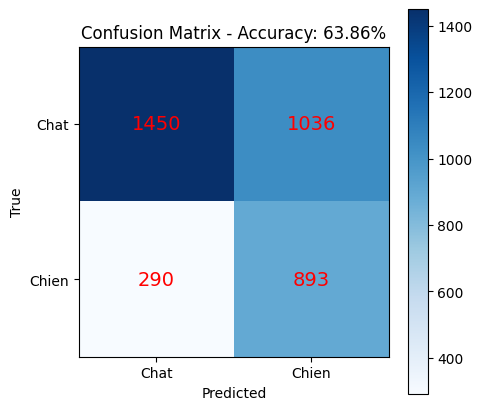

In [ ]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])


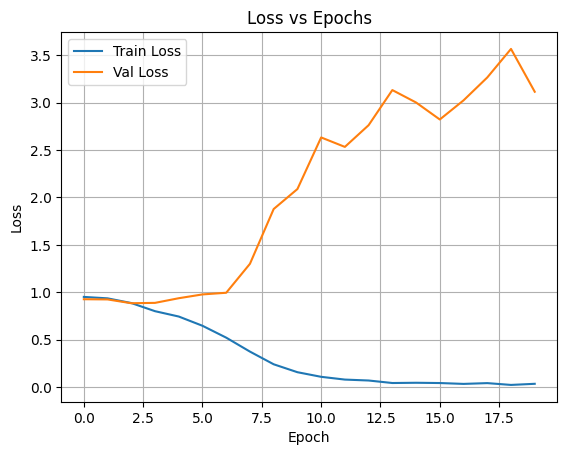

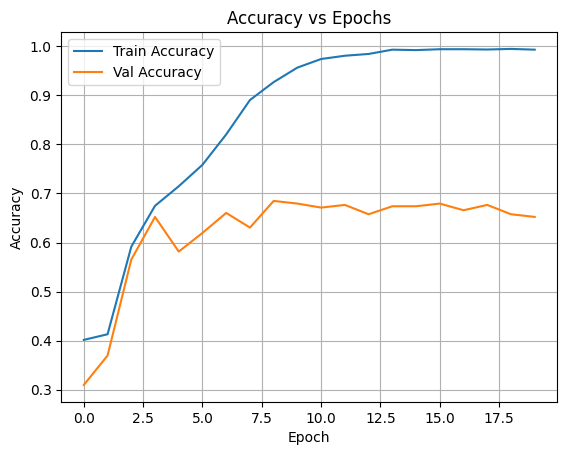

In [51]:
plot_history(history)

On remarque de l'overfitting ici, notre modèle a déjà du drop out, il est trop simple pour nos données. Il pénalise aussi trop les chiens maintenant qu'on a ajouté le poids.

CNN Improved

In [52]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNChatChienImproved(nn.Module):
    def __init__(self):
        super().__init__()

        # Bloc 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2,2)  # 224 -> 112

        # Bloc 2
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2,2)  # 112 -> 56

        # Bloc 3
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2,2)  # 56 -> 28

        # Bloc 4
        self.conv6 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(256)
        self.pool4 = nn.AdaptiveAvgPool2d((7,7))  # 28 -> 7

        self.dropout = nn.Dropout(0.5)

        # Classifier
        self.fc1 = nn.Linear(256*7*7, 256)
        self.fc2 = nn.Linear(256, 1)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool1(x)

        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        x = self.pool2(x)

        x = F.relu(self.bn5(self.conv5(x)))
        x = self.pool3(x)

        x = F.relu(self.bn6(self.conv6(x)))
        x = self.pool4(x)

        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [53]:
criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))

In [54]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChienImproved().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [55]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 1.1459 | Train Acc: 0.5423 | Val Loss: 0.8921 | Val Acc: 0.5027
Epoch [2/20] | Train Loss: 0.8866 | Train Acc: 0.5972 | Val Loss: 0.8289 | Val Acc: 0.6821
Epoch [3/20] | Train Loss: 0.8588 | Train Acc: 0.6322 | Val Loss: 0.8051 | Val Acc: 0.6821
Epoch [4/20] | Train Loss: 0.7974 | Train Acc: 0.6833 | Val Loss: 0.8143 | Val Acc: 0.6549
Epoch [5/20] | Train Loss: 0.7804 | Train Acc: 0.7074 | Val Loss: 0.7649 | Val Acc: 0.7011
Epoch [6/20] | Train Loss: 0.7359 | Train Acc: 0.7385 | Val Loss: 0.7126 | Val Acc: 0.7174
Epoch [7/20] | Train Loss: 0.7197 | Train Acc: 0.7482 | Val Loss: 0.7272 | Val Acc: 0.7582
Epoch [8/20] | Train Loss: 0.6950 | Train Acc: 0.7609 | Val Loss: 1.0744 | Val Acc: 0.5489
Epoch [9/20] | Train Loss: 0.6801 | Train Acc: 0.7624 | Val Loss: 0.7341 | Val Acc: 0.6793
Epoch [10/20] | Train Loss: 0.6525 | Train Acc: 0.7793 | Val Loss: 0.6683 | Val Acc: 0.7636
Epoch [11/20] | Train Loss: 0.6178 | Train Acc: 0.7805 | Val Loss: 0.6885 | Val Acc: 0.70

Confusion Matrix:
 [[1884  602]
 [ 181 1002]]
Accuracy: 78.66%


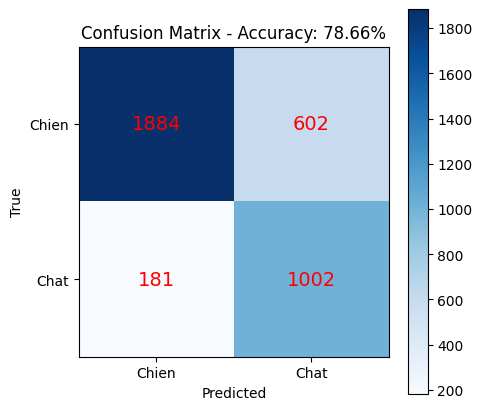

In [57]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])

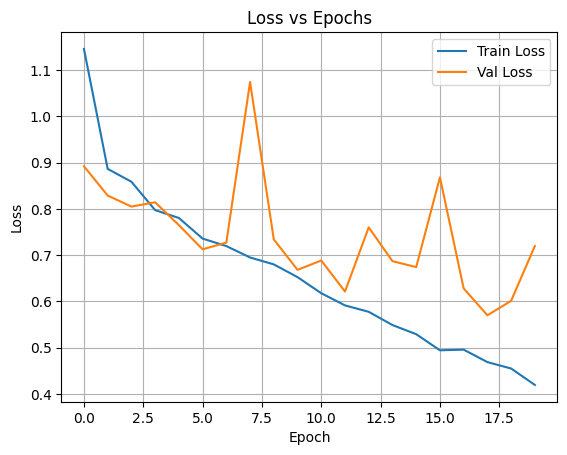

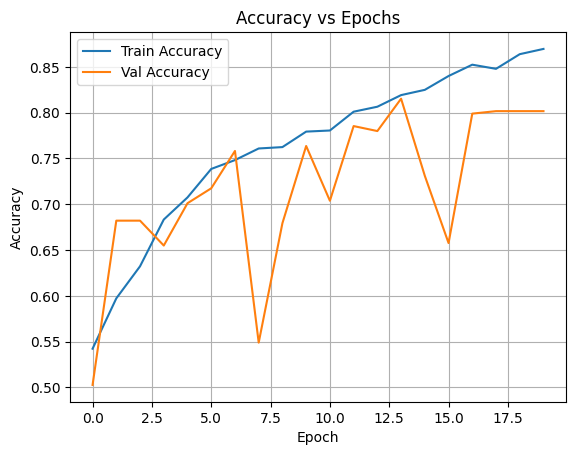

In [58]:
plot_history(history)

In [59]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChienImproved().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))

In [60]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=40
)


Epoch [1/40] | Train Loss: 1.0946 | Train Acc: 0.5628 | Val Loss: 0.9203 | Val Acc: 0.4321
Epoch [2/40] | Train Loss: 0.9105 | Train Acc: 0.5713 | Val Loss: 0.8753 | Val Acc: 0.6902
Epoch [3/40] | Train Loss: 0.8581 | Train Acc: 0.6431 | Val Loss: 0.8362 | Val Acc: 0.6005
Epoch [4/40] | Train Loss: 0.8260 | Train Acc: 0.6766 | Val Loss: 0.8088 | Val Acc: 0.6630
Epoch [5/40] | Train Loss: 0.8025 | Train Acc: 0.6941 | Val Loss: 0.8267 | Val Acc: 0.6250
Epoch [6/40] | Train Loss: 0.7738 | Train Acc: 0.7195 | Val Loss: 0.7570 | Val Acc: 0.7283
Epoch [7/40] | Train Loss: 0.7864 | Train Acc: 0.7183 | Val Loss: 0.7882 | Val Acc: 0.6875
Epoch [8/40] | Train Loss: 0.7619 | Train Acc: 0.7325 | Val Loss: 0.7364 | Val Acc: 0.6984
Epoch [9/40] | Train Loss: 0.7292 | Train Acc: 0.7494 | Val Loss: 0.9771 | Val Acc: 0.7092
Epoch [10/40] | Train Loss: 0.7207 | Train Acc: 0.7542 | Val Loss: 0.6791 | Val Acc: 0.7745
Epoch [11/40] | Train Loss: 0.6847 | Train Acc: 0.7726 | Val Loss: 0.7084 | Val Acc: 0.76

Confusion Matrix:
 [[2058  428]
 [ 230  953]]
Accuracy: 82.07%


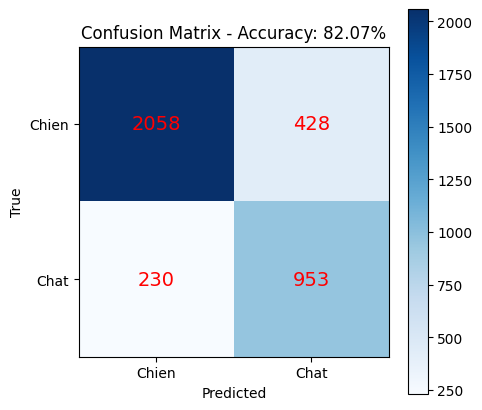

In [61]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])

Avec trop d'epoch on commence à perdre la précision sur la classe minoritaire

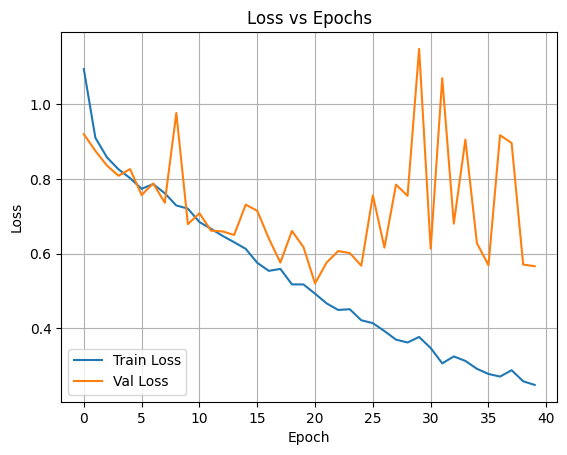

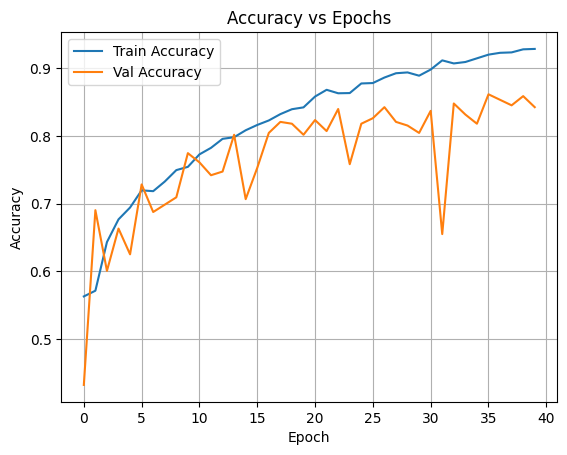

In [62]:
plot_history(history)

## Modèles pré-entrainés

### VGG-16

In [19]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Charger VGG16 pré-entraîné
vgg = models.vgg16(pretrained=True)

# Geler les features pour ne pas entraîner tout le réseau
for param in vgg.features.parameters():
    param.requires_grad = False

# Modifier le classifieur pour binaire
vgg.classifier[6] = nn.Linear(4096, 1)

model = vgg.to(device)


/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [20]:
import torch

# Récupérer tous les labels du train_dataset
labels_all = torch.tensor([label for _, label in train_subset])

n_chiens = (labels_all == 0).sum()   # minoritaire
n_chats = (labels_all == 1).sum()  # majoritaire
print(n_chats)
print(n_chiens)
pos_weight = n_chiens / n_chats     # >1 pour classe minoritaire
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))


tensor(2238)
tensor(1074)
pos_weight = 0.479892760515213


In [21]:
import torch.optim as optim

optimizer = optim.Adam(vgg.classifier.parameters(), lr=1e-4)


In [22]:
model, history = train_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=5)


Epoch [1/5] | Train Loss: 0.0739 | Train Acc: 0.9550 | Val Loss: 0.0367 | Val Acc: 0.9728
Epoch [2/5] | Train Loss: 0.0143 | Train Acc: 0.9928 | Val Loss: 0.0468 | Val Acc: 0.9783
Epoch [3/5] | Train Loss: 0.0072 | Train Acc: 0.9964 | Val Loss: 0.0577 | Val Acc: 0.9728
Epoch [4/5] | Train Loss: 0.0019 | Train Acc: 0.9994 | Val Loss: 0.1810 | Val Acc: 0.9321
Epoch [5/5] | Train Loss: 0.0097 | Train Acc: 0.9949 | Val Loss: 0.1152 | Val Acc: 0.9429


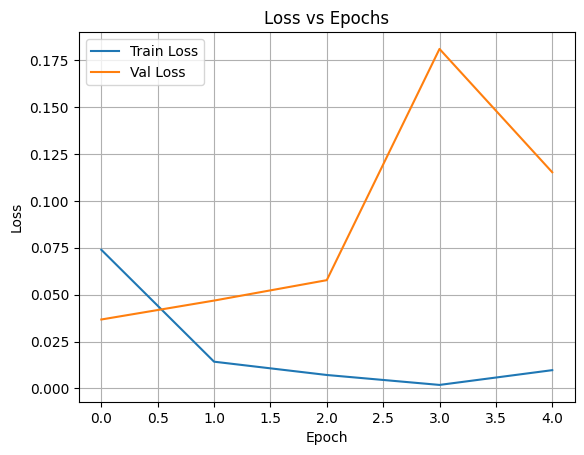

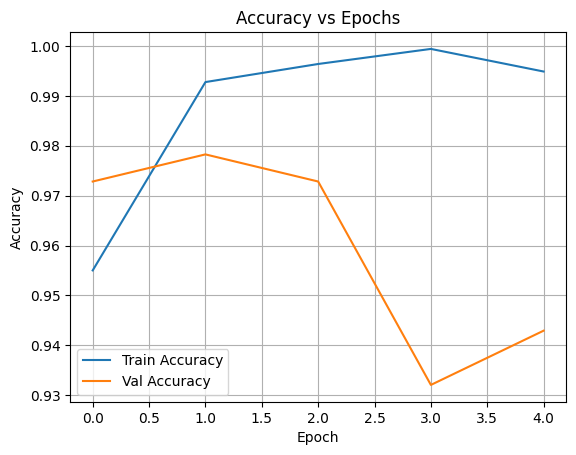

In [23]:
plot_history(history)

Confusion Matrix:
 [[1148   35]
 [  48 2438]]
Accuracy: 97.74%


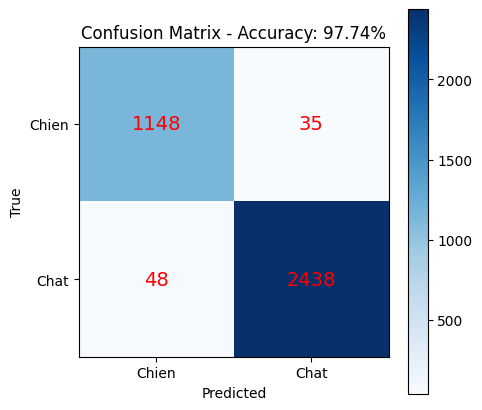

In [25]:
cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])


In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Charger VGG16 pré-entraîné
vgg = models.vgg16(pretrained=True)

# Geler les features pour ne pas entraîner tout le réseau
for param in vgg.features.parameters():
    param.requires_grad = False

# Modifier le classifieur pour binaire
vgg.classifier[6] = nn.Linear(4096, 1)

model = vgg.to(device)


/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /home/procope/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:04<00:00, 116MB/s]  


In [ ]:
import torch

# Récupérer tous les labels du train_dataset
labels_all = torch.tensor([label for _, label in train_subset])

n_chats = (labels_all == 0).sum()   # minoritaire
n_chiens = (labels_all == 1).sum()  # majoritaire
print(n_chats)
print(n_chiens)
pos_weight = n_chiens / n_chats     # >1 pour classe minoritaire
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))


tensor(1074)
tensor(2238)
pos_weight = 2.083798885345459


In [ ]:
import torch.optim as optim

optimizer = optim.Adam(vgg.classifier.parameters(), lr=1e-4)


In [ ]:
model, history = train_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=20)


Epoch [1/20] | Train Loss: 0.0305 | Train Acc: 0.9915 | Val Loss: 0.1210 | Val Acc: 0.9620
Epoch [2/20] | Train Loss: 0.0158 | Train Acc: 0.9943 | Val Loss: 0.1669 | Val Acc: 0.9620
Epoch [3/20] | Train Loss: 0.0037 | Train Acc: 0.9988 | Val Loss: 0.1613 | Val Acc: 0.9647
Epoch [4/20] | Train Loss: 0.0018 | Train Acc: 0.9994 | Val Loss: 0.1790 | Val Acc: 0.9647
Epoch [5/20] | Train Loss: 0.0012 | Train Acc: 0.9997 | Val Loss: 0.1830 | Val Acc: 0.9674
Epoch [6/20] | Train Loss: 0.0004 | Train Acc: 1.0000 | Val Loss: 0.1772 | Val Acc: 0.9647
Epoch [7/20] | Train Loss: 0.0001 | Train Acc: 1.0000 | Val Loss: 0.2140 | Val Acc: 0.9674
Epoch [8/20] | Train Loss: 0.0022 | Train Acc: 0.9994 | Val Loss: 0.1673 | Val Acc: 0.9701
Epoch [9/20] | Train Loss: 0.0849 | Train Acc: 0.9846 | Val Loss: 0.1842 | Val Acc: 0.9620
Epoch [10/20] | Train Loss: 0.0337 | Train Acc: 0.9925 | Val Loss: 0.2575 | Val Acc: 0.9592
Epoch [11/20] | Train Loss: 0.0242 | Train Acc: 0.9958 | Val Loss: 0.1900 | Val Acc: 0.97

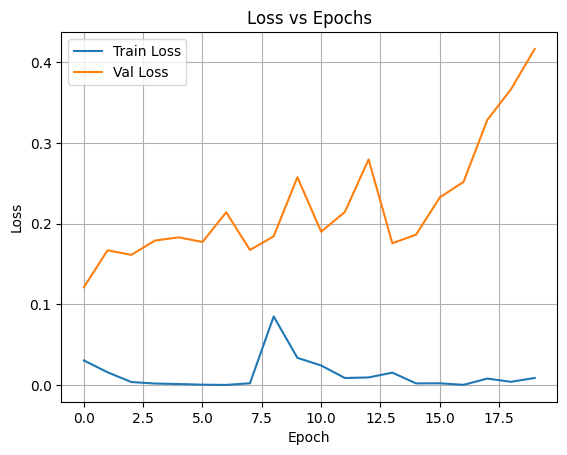

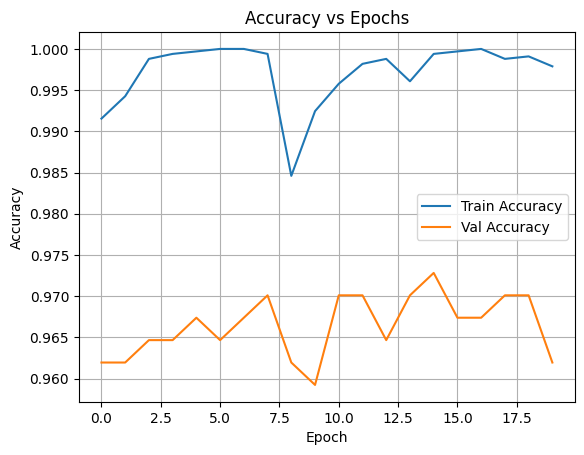

In [42]:
plot_history(history)

Confusion Matrix:
 [[1059  124]
 [  13 2473]]
Accuracy: 96.27%


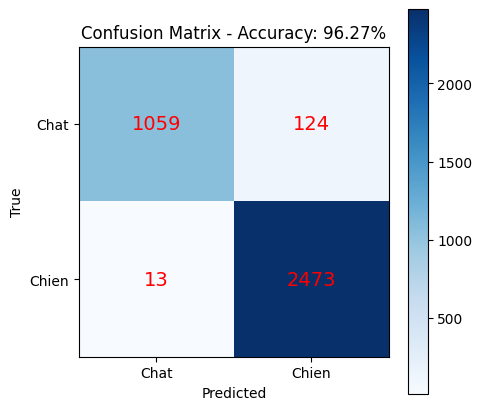

In [44]:
cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chat", "Chien"])
